
## Import libraries

In [1]:
# Importing the Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly
import plotly.graph_objs as go
import warnings
# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

plt.style.use('ggplot') 

warnings.filterwarnings('ignore')

<a id="explore"></a>
## Exploring the data

Let's get to know the data we will be working with a little bit better. For that we will check the data for null values, the ranges of feature values etc., and then we'll make use of some visualization tools and try to gain some insights about the data we are dealing with.

In [2]:
customer_data = pd.read_csv("dataset\segmentation data.csv")
data = customer_data.copy()
data.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


In [4]:
data.describe()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2.000000e+03,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,1.000010e+08,0.457000,0.496500,35.909000,1.03800,120954.419000,0.810500,0.739000
std,5.774946e+02,0.498272,0.500113,11.719402,0.59978,38108.824679,0.638587,0.812533
min,1.000000e+08,0.000000,0.000000,18.000000,0.00000,35832.000000,0.000000,0.000000
25%,1.000005e+08,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,1.000010e+08,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000015e+08,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000020e+08,1.000000,1.000000,76.000000,3.00000,309364.000000,2.000000,2.000000


Few columns that are of int64 type should be categorical 

In [5]:
#checking unique values
data.Sex.value_counts()

Sex
0    1086
1     914
Name: count, dtype: int64

0 - Male, 1 - Female

Out of 2000 customers, 1086 are male and 914 are female.

In [6]:
data['Marital status'].value_counts()

Marital status
0    1007
1     993
Name: count, dtype: int64

0 - Single
1 - non-single (divorced / separated / married / widowed)	


Marital status of 1007 out of 2000 customers is single, 993 of them are married

In [7]:
data.Education.value_counts()

Education
1    1386
2     291
0     287
3      36
Name: count, dtype: int64

0 - other/unknown

1 - high school

2 - university

3 - graduate school

36 out of 2000 customers are grad school graduates, 287 are have unknown education, 291 are university graduates, 1386 are high school graduates.

In [8]:
data.Occupation.value_counts()

Occupation
1    1113
0     633
2     254
Name: count, dtype: int64

0 - unemployed/unskilled

1 - skilled employee/official

2 - management/self-employed/highly qualified employee/officer



In [9]:
data['Settlement size'].value_counts()

Settlement size
0    989
1    544
2    467
Name: count, dtype: int64

0 - small city

1 - mid-sized city

2 - big city

In [10]:
#dropping the Id column as it is of no use
data.drop('ID',axis = 1, inplace = True)

#### Countplots

Next, let's peek at the countplots of categorical features, which show the counts of observations in each categorical bin using bars.

In [11]:
feature_labels = {
    'Sex':['male','female'], 
    'Marital status': ['single', 'non-single'],   
    'Education':['other / unknown','high school','university','graduate school'],
    'Occupation':['unemployed / unskilled', 'skilled employee / official', 'self-employed / other'],
    'Settlement size':['small city', 'mid-sized city', 'big city']
}


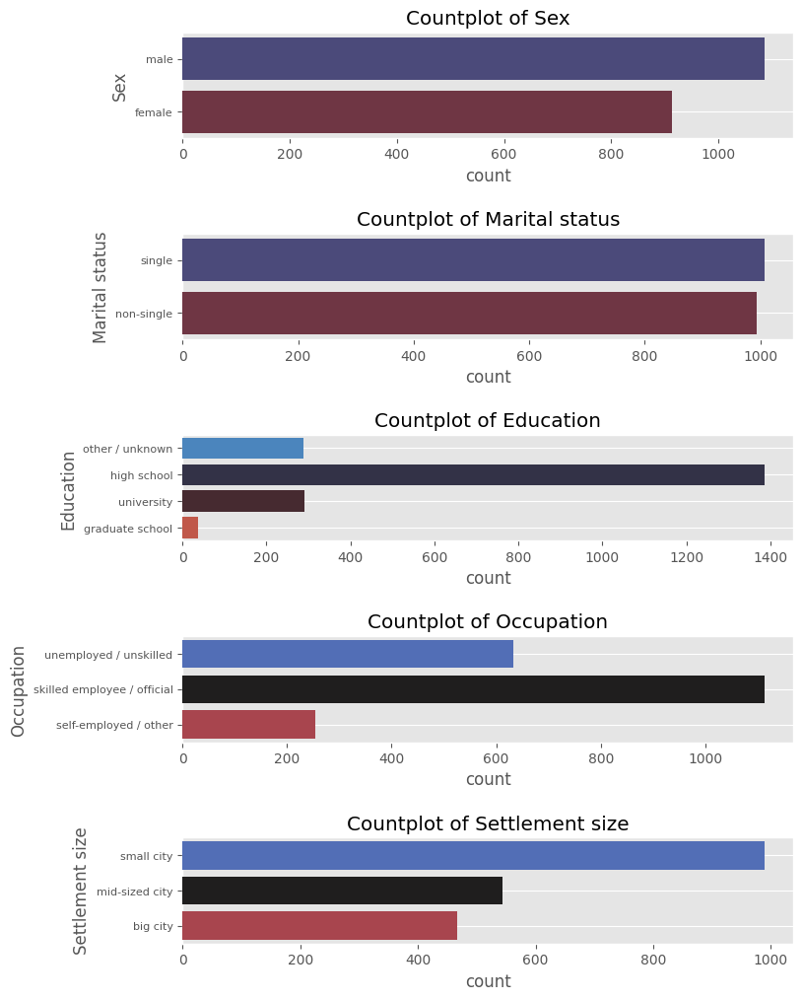

In [12]:
fig, ax = plt.subplots(5,1,figsize=(8,12))
plt.subplots_adjust(hspace=0.9, wspace=0.4)

for i, (feature, labels) in enumerate(feature_labels.items()):
    plt.subplot(5,1,i+1)
    sns.countplot(data=data, y=feature, palette='icefire', zorder=3)
    plt.gca().set_yticklabels(labels, fontsize=8)  # subsitute the categorical values from dataset description.
    plt.grid()
    plt.title('Countplot of {}'.format(feature))

Some observations based on the above countplots: 

*Education*: From the data in this dataset, we can deduce that the highest degree the majority of customers in this supermarket mall have is the high school diploma. Sometimes people with the first degree stop by, and more rarely do people with a higher degree.

*Occupation*: The majority of our customers do have the job. Relating this information to education levels of customers we see that there is around 600 unemployed customers, which are supposedly the people who don't have a job at this very moment, high schoolers/students or customers who just decided not to mention it.

*Settlement size*: The half of the customers happen to live in small cities, while the rest are living in either mid-sized or big cities.

#### Distribution plots

Let's look at the distribution of values for Age and Income features.

In [13]:
# The median income
data.Income.median()

115548.5

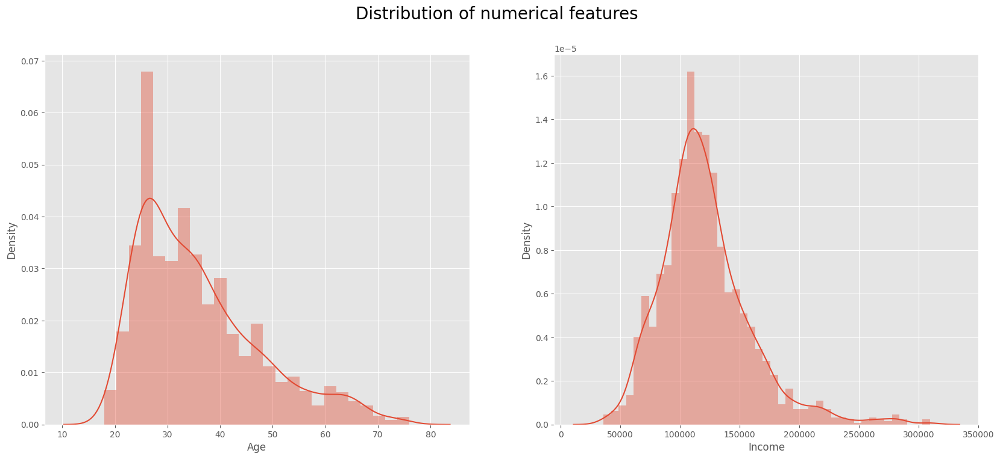

In [14]:
plt.rcParams['figure.figsize']=(20,8)
fig, ax = plt.subplots(nrows = 1, ncols = 2)
plt.suptitle('Distribution of numerical features',size = 20)
sns.distplot(x = data['Age'],ax = ax[0],axlabel = 'Age')
sns.distplot(x = data['Income'], ax = ax[1],axlabel = 'Income')
plt.show()

Most of the customers are between 20 to 40 years old, meanwhile the annual income is spread between 90-150 k($). Both of these distributions are right-skewed.

In [15]:
#Separating categorical and numerical features
cat_features = ['Sex','Marital status','Education','Occupation','Settlement size']
num_features = ['Age','Income']

Checking for outliers

We define outliers as the values lying 1.5 * IQR left of the 1st quartile and 1.5 * IQR right of the 3rd quartile

In [16]:
#checking for the presence of outliers
for num_col in num_features:
    q1 = data[num_col].quantile(0.25) #first quartile
    q3 = data[num_col].quantile(0.75) #3rd quartile
    
    #calculating inter-quartile range
    IQR = q3-q1
    
    #setting upper and lower bounds
    upper = q3 + 1.5*IQR
    lower = q1 - 1.5*IQR
    
    #checking if there is any value beyond the upper and lower bounds
    if data[(data[num_col] > upper) | (data[num_col] < lower)].any(axis = None):
        print(num_col, ': Yes')
        
    else:
        print(num_col, ': No')

Age : Yes
Income : Yes


We confirm that there are outliers in our data and must be dealt with accordingly

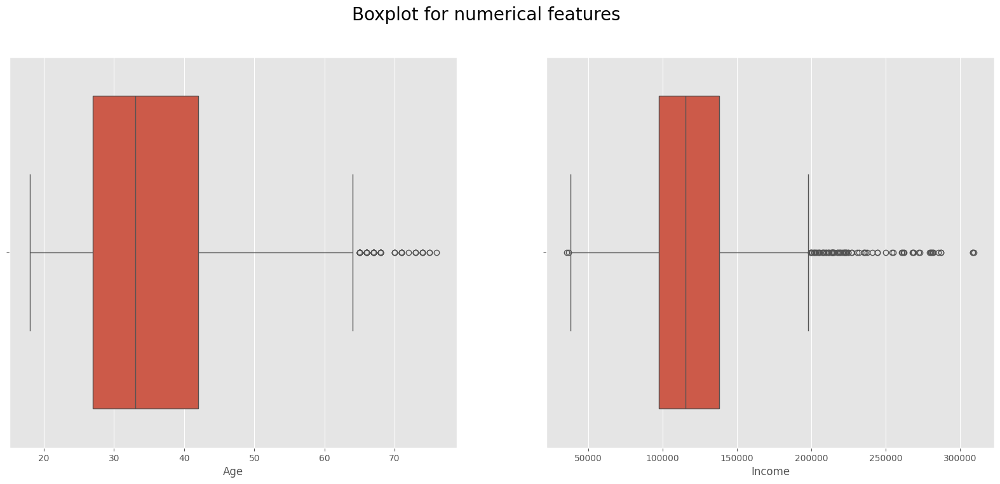

In [17]:
#creating boxplot to look at the outliers
plt.rcParams['figure.figsize']=(20,8)
fig, ax = plt.subplots(nrows = 1, ncols = 2)
plt.suptitle('Boxplot for numerical features',size = 20)
sns.boxplot(data = data, x = 'Age',ax = ax[0])
sns.boxplot(data = data, x = 'Income', ax = ax[1])
plt.show()

All the outliers lying beyond the upper limit will be set to upper limit and those lying beyond the lower limit will be set to lower limit

In [18]:
for num_col in num_features:
    q1 = data[num_col].quantile(0.25) #first quartile
    q3 = data[num_col].quantile(0.75) #3rd quartile
    
    #calculating inter-quartile range
    IQR = q3-q1
    
    #setting upper and lower bounds
    upper = q3 + 1.5*IQR
    lower = q1 - 1.5*IQR
    
    data.loc[data[num_col] > upper, num_col] = upper
    data.loc[data[num_col] < lower, num_col] = lower

In [19]:
#again checking for outliers
for num_col in num_features:
    q1 = data[num_col].quantile(0.25) #first quartile
    q3 = data[num_col].quantile(0.75) #3rd quartile
    
    #calculating inter-quartile range
    IQR = q3-q1
    
    #setting upper and lower bounds
    upper = q3 + 1.5*IQR
    lower = q1 - 1.5*IQR
    
    #checking if there is any value beyond the upper and lower bounds
    if data[(data[num_col] > upper) | (data[num_col] < lower)].any(axis = None):
        print(num_col, ': Yes')
        
    else:
        print(num_col, ': No')

Age : No
Income : No


No more outliers

In [20]:
#checking the summary statistics
data.describe()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
count,2000.000000,2000.000000,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000
mean,0.457000,0.496500,35.798250,1.03800,119501.931625,0.810500,0.739000
std,0.498272,0.500113,11.413394,0.59978,33693.203903,0.638587,0.812533
min,0.000000,0.000000,18.000000,0.00000,37049.750000,0.000000,0.000000
25%,0.000000,0.000000,27.000000,1.00000,97663.250000,0.000000,0.000000
50%,0.000000,0.000000,33.000000,1.00000,115548.500000,1.000000,1.000000
75%,1.000000,1.000000,42.000000,1.00000,138072.250000,1.000000,1.000000
max,1.000000,1.000000,64.500000,3.00000,198685.750000,2.000000,2.000000


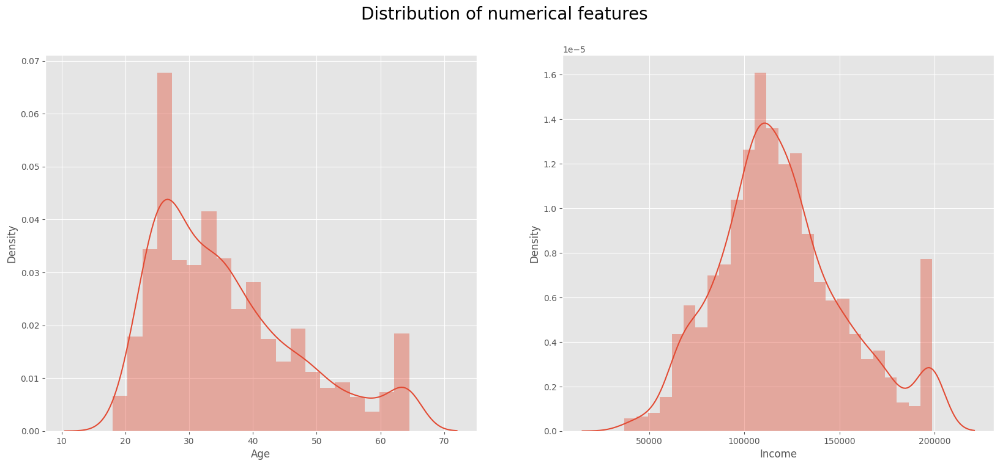

In [21]:
plt.rcParams['figure.figsize']=(20,8)
fig, ax = plt.subplots(nrows = 1, ncols = 2)
plt.suptitle('Distribution of numerical features',size = 20)
sns.distplot(x = data['Age'],ax = ax[0],axlabel = 'Age')
sns.distplot(x = data['Income'], ax = ax[1],axlabel = 'Income')
plt.show()

Income resembles normal distribution very closely but the multiple peaks in both distributions hint towards separate clusters

#### Scatterplots

Let's see what the relation between the Age and Income with respect to different categorical features reveals about the data.

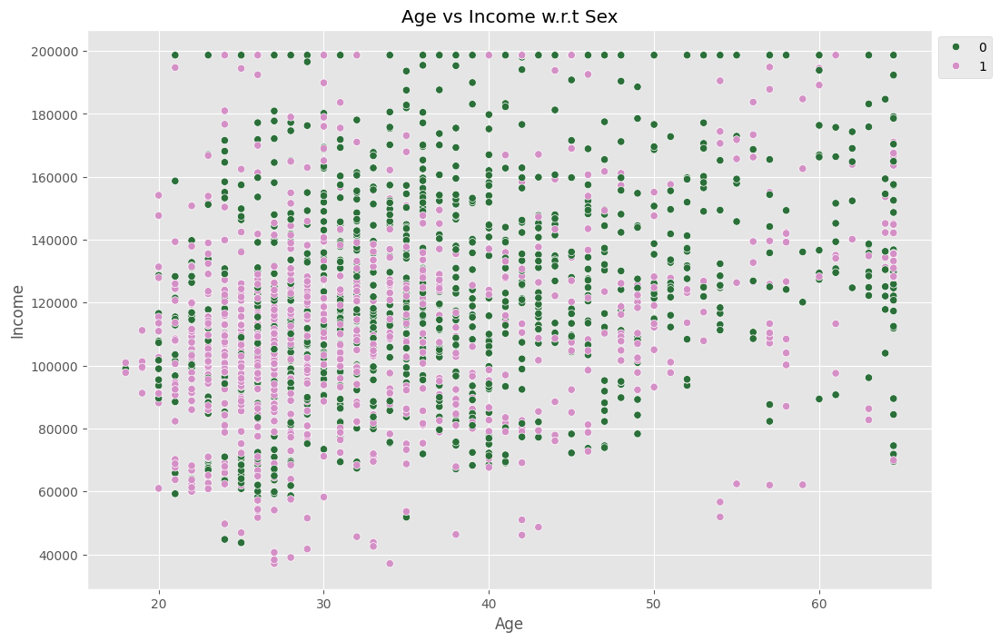

In [22]:
plt.figure(figsize=(12,8))
sns.scatterplot(data = data, x='Age', y='Income', hue='Sex', palette='cubehelix')
plt.title('Age vs Income w.r.t Sex')
plt.legend(loc = 'upper left', bbox_to_anchor = (1,1))
plt.show()

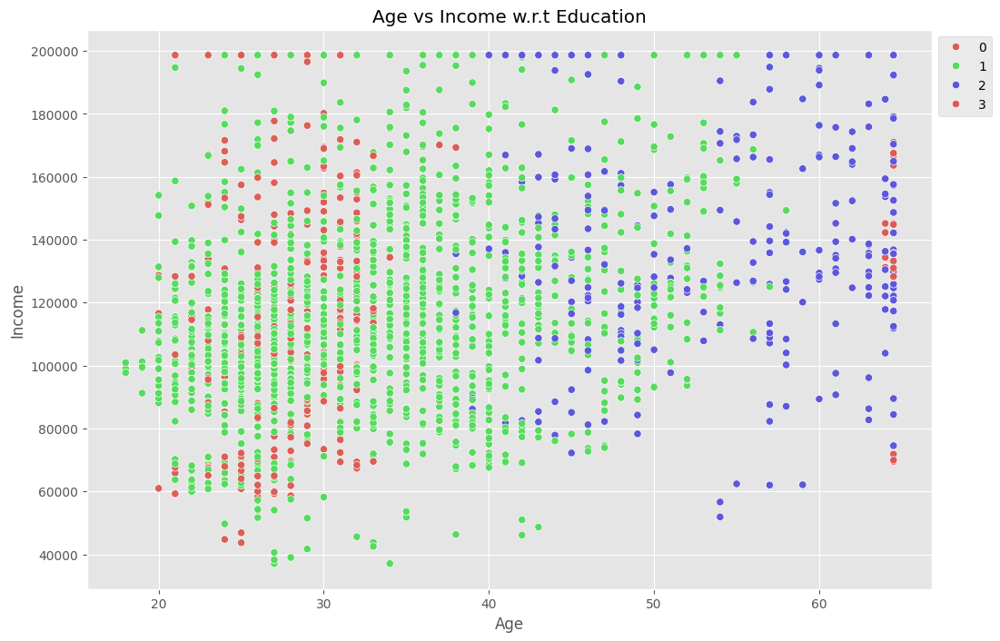

In [23]:
plt.figure(figsize=(12,8))
sns.scatterplot(data = data, x='Age', y='Income', hue='Education', palette='hls')
plt.title('Age vs Income w.r.t Education')
plt.legend(loc = 'upper left', bbox_to_anchor = (1,1))
plt.show()

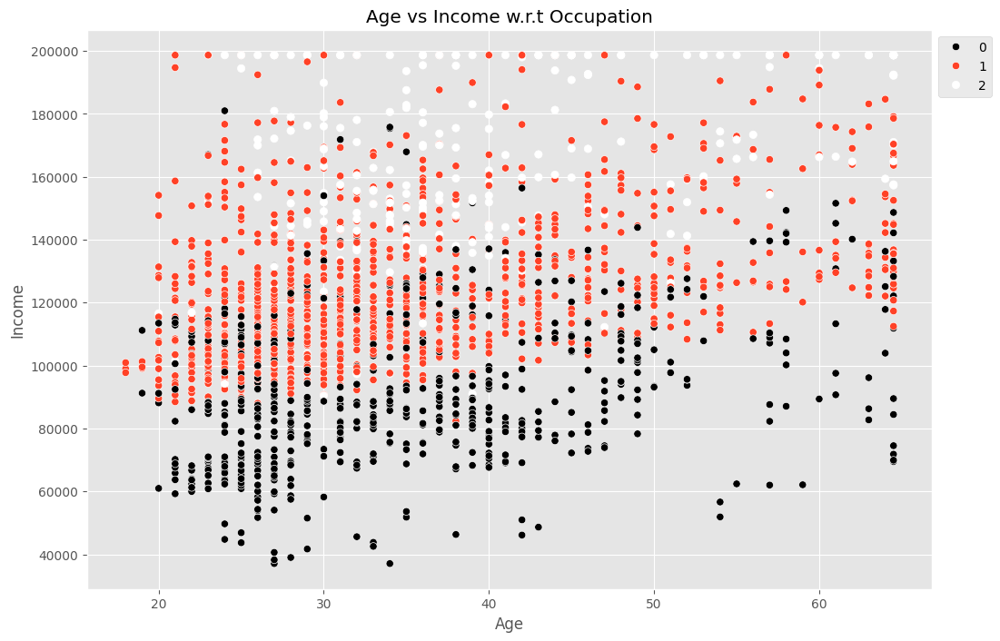

In [24]:
plt.figure(figsize=(12,8))
sns.scatterplot(data = data, x='Age', y='Income', hue='Occupation', palette='CMRmap')
plt.title('Age vs Income w.r.t Occupation')
plt.legend(loc = 'upper left', bbox_to_anchor = (1,1))
plt.show()

It's common sense to think that the more skilled the person is, the higher income they have. And this plot confirms it.

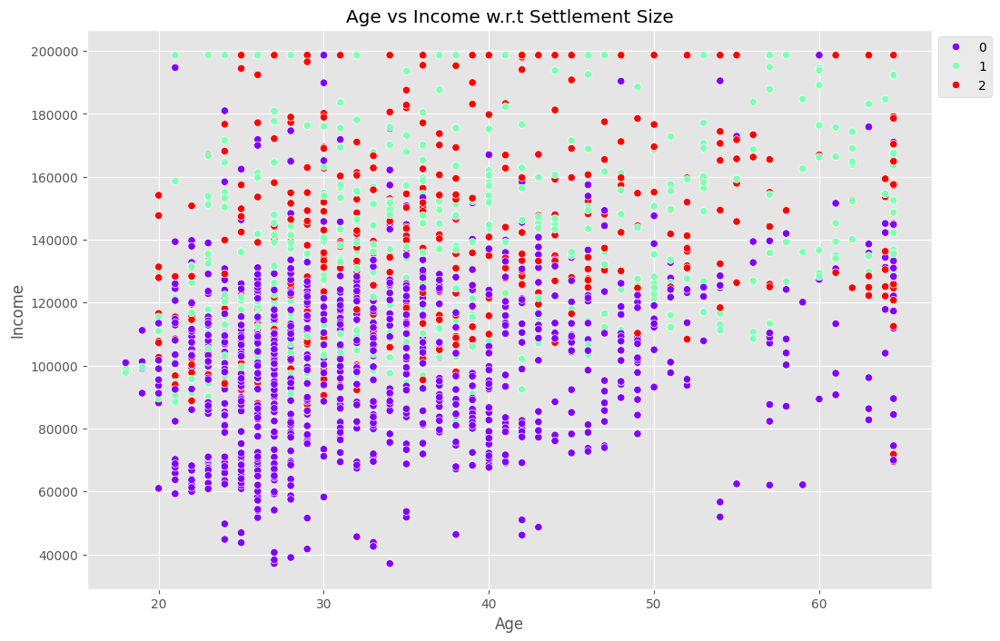

In [25]:
plt.figure(figsize=(12,8))
sns.scatterplot(data = data, x='Age', y='Income', hue='Settlement size', palette='rainbow')
plt.title('Age vs Income w.r.t Settlement Size')
plt.legend(loc = 'upper left', bbox_to_anchor = (1,1))
plt.show()

The plot above shows that people living in small cities are usually paid less, meanwhile the annual salaries of these living in larger cities commonly range from 100 k(dollars) to 250 k(dollars).

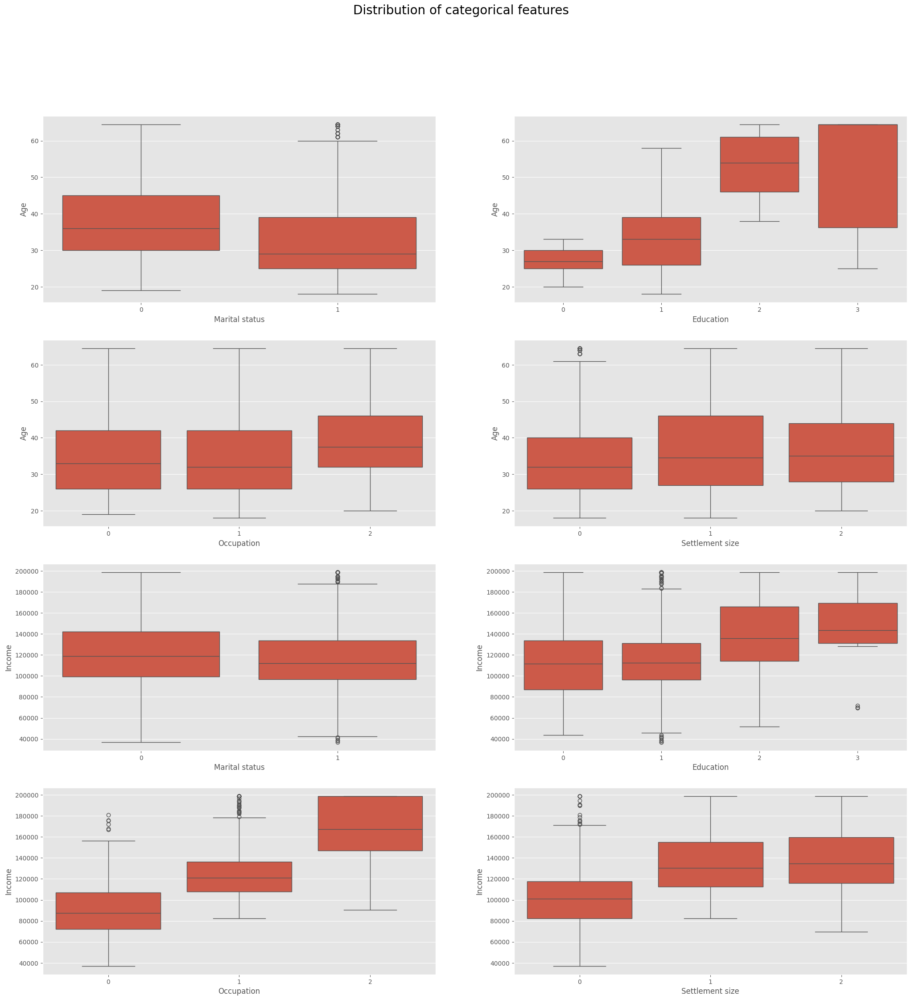

In [26]:
#checking the distribution of categorical features against age and income columns using boxplots
plt.rcParams['figure.figsize']=(25,25)
fig, ax = plt.subplots(nrows = 4, ncols = 2)
plt.suptitle('Distribution of categorical features',size = 20)
for col, axes in zip(cat_features[1:], ax.flat[:len(cat_features)]):
    sns.boxplot(data = data, x = col,y = 'Age',ax = axes)

for col, axes in zip(cat_features[1:], ax.flat[len(cat_features)-1:]):
    sns.boxplot(data = data, x = col,y = 'Income',ax = axes)

### Dimensionality Reduction

In [27]:
from sklearn.preprocessing import StandardScaler

# Scaling the data
std = StandardScaler()
data_std = pd.DataFrame(std.fit_transform(data), columns=data.columns)

data_std.head()

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,-0.917399,-0.993024,2.515372,1.604323,0.153424,0.296823,1.552326
1,1.090038,1.007025,-1.209255,-0.063372,0.928344,0.296823,1.552326
2,-0.917399,-0.993024,1.156979,-0.063372,-0.899277,-1.269525,-0.909730
3,-0.917399,-0.993024,0.806425,-0.063372,1.545596,0.296823,0.321298
4,-0.917399,-0.993024,1.507532,-0.063372,0.876629,0.296823,0.321298


In [28]:
from sklearn.decomposition import PCA
import pandas as pd

# Apply PCA to reduce dimensions to 3
pca = PCA(n_components=3, random_state=5)
data_reduced = pd.DataFrame(pca.fit_transform(data_std), columns=['PC0', 'PC1', 'PC2'])

# Get the variance explained by each of the three components
explained_variance_ratio = pca.explained_variance_ratio_

# Print variance explained by each principal component
for i, variance in enumerate(explained_variance_ratio):
    print(f"Principal Component {i}: {variance:.2%} variance explained")

# Optional: Print cumulative variance explained
cumulative_variance = explained_variance_ratio.cumsum()
print(f"Cumulative Variance Explained by the 3 Components: {cumulative_variance[-1]:.2%}")

Principal Component 0: 35.99% variance explained
Principal Component 1: 26.17% variance explained
Principal Component 2: 18.93% variance explained
Cumulative Variance Explained by the 3 Components: 81.09%


In [29]:
data_reduced.head()

,PC0,PC1,PC2
0,2.475899,0.798415,2.113411
1,0.429175,0.627629,-2.241491
2,-0.686420,-0.695542,2.307151
3,1.839629,-0.543780,0.717125
4,1.709848,-0.411698,1.260236


In [30]:
import plotly.graph_objects as go

# Enhanced 3D Scatter Plot
trace = go.Scatter3d(
    x=data_reduced['PC0'],
    y=data_reduced['PC1'],
    z=data_reduced['PC2'],
    mode='markers',
    marker=dict(
        size=6,                   # Increase marker size for better visibility
        opacity=0.8,
        color=data_reduced['PC0'], # Use a color gradient based on one of the components
        colorscale='Viridis',      # A more visually appealing color scale
        colorbar=dict(title='PC0'), # Add a color bar to indicate scale
    ),
    text=[f'PC0: {x:.2f}, PC1: {y:.2f}, PC2: {z:.2f}' for x, y, z in zip(data_reduced['PC0'], data_reduced['PC1'], data_reduced['PC2'])],
    hoverinfo='text' # Show component values on hover
)

# Updated layout with better labels and aspect ratio
layout = go.Layout(
    title=dict(text='3D Scatter Plot of Principal Components', x=0.5),
    scene=dict(
        xaxis=dict(title='Principal Component 1'),
        yaxis=dict(title='Principal Component 2'),
        zaxis=dict(title='Principal Component 3'),
        bgcolor='rgba(240,240,240,0.95)', # Light background for better contrast
    ),
    width=700, height=700,
    margin=dict(l=0, r=0, b=0, t=40), # Reduce margins for a more compact plot
)

# Combine trace and layout into a figure
fig = go.Figure(data=[trace], layout=layout)

# Display the figure
fig.show()


From above 3d graph, it looks like we have around 6-7 clusters

## Clustering

### K-Means

In [31]:
import plotly.graph_objects as go
from sklearn.cluster import KMeans

# Calculate the WCSS values for a range of cluster numbers
scores = []
for i in range(2, 21):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)
    kmeans.fit(data_reduced)
    scores.append(kmeans.inertia_)

# Creating an interactive Plotly scatter plot
fig = go.Figure()

# Adding the WCSS values as a line plot with markers
fig.add_trace(go.Scatter(
    x=list(range(2, 21)),
    y=scores,
    mode='lines+markers',
    marker=dict(color='red', size=8),
    line=dict(color='blue', width=2),
    name='WCSS'
))

# Highlighting the elbow point (replace 5 with your observed elbow point if necessary)
elbow_point = 7  # You can adjust this based on your data
fig.add_vline(
    x=elbow_point,
    line=dict(color='green', width=2, dash="dash"),
    annotation_text=f"Elbow at k={elbow_point}",
    annotation_position="top left"
)

# Customizing layout for better interactivity and readability
fig.update_layout(
    title='Elbow Method for Optimal Number of Clusters',
    xaxis_title='Number of Clusters',
    yaxis_title='Within-Cluster Sum of Squares (WCSS)',
    xaxis=dict(tickmode='linear', tick0=2, dtick=1),
    hovermode="x unified",
    template="plotly_white",
    width=800,
    height=500
)

# Displaying the interactive plot
fig.show()


As you can see, we don't have a clear elbow, but let's assume it is somewhere around k=6 or k = 7.

Let's take another approach before deciding about the number of clusters - the silhouette score plot. 

In [32]:
from sklearn.metrics import silhouette_score

# Calculate silhouette scores for a range of cluster numbers
silhouette_scores = []
for i in range(2, 21):
    kmeans = KMeans(n_clusters=i, init="k-means++", random_state=42)  # Using k-means++ initialization
    kmeans.fit(data_reduced)
    silhouette_scores.append(silhouette_score(data_reduced, kmeans.labels_))

# Creating an interactive Plotly scatter plot
fig = go.Figure()

# Adding silhouette scores as a line plot with markers
fig.add_trace(go.Scatter(
    x=list(range(2, 21)),
    y=silhouette_scores,
    mode='lines+markers',
    marker=dict(color='red', size=8),
    line=dict(color='blue', width=2),
    name='Silhouette Score'
))

# Adding annotations for the best silhouette score
max_score_index = silhouette_scores.index(max(silhouette_scores)) + 2  # +2 to adjust for the starting index
fig.add_annotation(
    x=max_score_index,
    y=max(silhouette_scores),
    text=f'Max Silhouette Score: {max(silhouette_scores):.2f}',
    showarrow=True,
    arrowhead=2,
    ax=0,
    ay=-50,
    bgcolor='lightyellow',
    bordercolor='black',
    borderwidth=1
)

# Adding a vertical line at k = 7
fig.add_vline(x=7, line=dict(color='green', dash='dash'), annotation_text='k = 7', 
               annotation_position='top right', annotation=dict(font_size=12, font_color='green'))

# Customizing layout for better interactivity and readability
fig.update_layout(
    title='Silhouette Scores for Optimal Number of Clusters',
    xaxis_title='Number of Clusters (k)',
    yaxis_title='Silhouette Score',
    xaxis=dict(tickmode='linear', tick0=2, dtick=1),
    hovermode="x unified",
    template="plotly_white",
    width=800,
    height=500
)

# Displaying the interactive plot
fig.show()

Let's take k = 7

#### Fitting KMeans with the best parameters

Now, let's visualize these clusters to check how well the algorithm performed.

In [38]:
kmeans = KMeans(n_clusters=7)
data['kmeans_cluster'] = kmeans.fit_predict(data_reduced) # Fit the model and predict clusters
data['kmeans_cluster'] = data['kmeans_cluster'].astype('category')

In [41]:
data['kmeans_cluster'].value_counts()

kmeans_cluster
1    644
2    312
0    311
3    243
5    185
6    168
4    137
Name: count, dtype: int64

In [34]:
# Define distinct colors for clusters
distinct_colors = [
    'red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow', 'black', 'pink',
    'brown', 'lightblue', 'lightgreen', 'violet', 'gold', 'lightgray', 'navy', 'lime', 'teal', 'coral'
]

# Ensure the number of distinct colors matches the number of clusters
num_clusters = data['kmeans_cluster'].nunique()
color_mapping = {i: distinct_colors[i % len(distinct_colors)] for i in range(num_clusters)}
data['cluster_color'] = data['kmeans_cluster'].map(color_mapping)

# Create a scatterplot with enhanced interactivity and representation
trace = go.Scatter3d(
    x=data_reduced['PC0'],
    y=data_reduced['PC1'],
    z=data_reduced['PC2'],
    mode='markers',
    marker=dict(
        size=5,  # Increase marker size for better visibility
        opacity=0.8,
        color=data['cluster_color'],  # Use distinct colors for each cluster
    ),
    text=data['kmeans_cluster'],  # Add cluster info to hover
)

# Layout customization for better aesthetics
layout = go.Layout(
    title=dict(text='3D Scatter Plot of Clusters (KMeans)', x=0.5),
    width=800,  # Wider for better viewing
    height=700,
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3',
        camera=dict(eye=dict(x=1.2, y=1.2, z=0.5))  # Adjust camera view for better perspective
    ),
    legend=dict(font=dict(size=12), itemsizing="constant"),
    hovermode='closest',  # Hovering will show closest point info
    margin=dict(l=0, r=0, b=0, t=40)  # Adjust margins for a cleaner look
)

# Create the figure
fig = go.Figure(data=[trace], layout=layout)

# Display the interactive plot
fig.show()

#### *The distribution of clusters*

In [45]:
import plotly.express as px

# Create an interactive count plot with Plotly
fig = px.histogram(data, x='kmeans_cluster', color='kmeans_cluster', 
                   color_discrete_sequence=px.colors.sequential.Magenta, 
                   title='Distribution of Clusters', 
                   labels={'kmeans_cluster': 'Cluster'})

# Customize layout and add hover effects
fig.update_layout(
    xaxis_title='KMeans Clusters',
    yaxis_title='Count',
    title_x=0.5,
    plot_bgcolor='rgba(0,0,0,0)'
)
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Display the figure
fig.show()

So, the number of instances in each cluster is very roughly the same, without large fluctuations. 

Let's experiment with other clustering algorithms to see the differences they make and pick the one that fits the data the best.

### DBSCAN

Before using DBSCAN for clustering, we need to find the best hyperparameters for it.

It has 2 main hyperparameters: eps and min_samples

In [36]:
from sklearn.neighbors import NearestNeighbors

# Fit the NearestNeighbors model
nn = NearestNeighbors(n_neighbors=10).fit(data_reduced)

# Calculate the distance to the k-nearest neighbors
distances, indices = nn.kneighbors(data_reduced)

# Sort the distances and take the second column (distance to the 10th nearest neighbor)
distances = np.sort(distances, axis=0)
distances = distances[:, 1]

# Create an interactive Plotly scatter plot for distances
fig = go.Figure()

# Add the distances as a line plot with markers
fig.add_trace(go.Scatter(
    x=list(range(len(distances))),  # Number of points
    y=distances,
    mode='lines+markers',
    marker=dict(color='green', size=5),
    line=dict(color='blue', width=2),
))

# Adding annotations for clarity
fig.add_annotation(
    x=0,
    y=max(distances),
    text='Average distance to 10th neighbor',
    showarrow=True,
    arrowhead=2,
    ax=0,
    ay=-40,
    bgcolor='lightyellow',
    bordercolor='black',
    borderwidth=1
)

# Customizing layout for better aesthetics
fig.update_layout(
    title='Average Distance to 10th Nearest Neighbor',
    xaxis_title='Points (sorted by distance)',
    yaxis_title='Distance (eps)',
    template='plotly_white',
    width=800,
    height=500,
    hovermode='closest',
)

# Display the interactive plot
fig.show()

After various trials for finding best values for 'eps' and 'min_sample', we find that `eps` ranges from 0.8 to 1 and `min_sample` from 5 to 25. 

Now, our final choice of parameters will be decided by the best silhouette score DBSCAN gives depending on the ranges of parameters we have. Let's calculate it.

In [46]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# Prepare parameters
db_silhouette_scores = []
params = [(ms, eps.round(3)) for ms in range(5, 25) for eps in np.arange(0.8, 1.0, step=0.1)]

# Calculate silhouette scores for each combination of min_samples and eps
for ms, eps in params:  
    pred_labels = DBSCAN(eps=eps, min_samples=ms).fit(data_reduced).labels_
    
    # Calculate silhouette score; ignore noise (-1) labels
    if len(set(pred_labels)) > 1:  # Ensure there is more than one cluster
        score = silhouette_score(data_reduced, pred_labels)
    else:
        score = -1  # Assign a negative score if there is only one cluster (or all noise)
    
    db_silhouette_scores.append(score)

# Creating an interactive Plotly scatter plot
fig = go.Figure()

# Add silhouette scores as a scatter plot
fig.add_trace(go.Scatter(
    x=[f'Min Samples: {ms}, Eps: {eps}' for ms, eps in params],
    y=db_silhouette_scores,
    mode='markers+lines',
    marker=dict(color='blue', size=8),
    line=dict(color='blue', width=2),
    name='Silhouette Score'
))

# Identify the maximum silhouette score and its parameters
max_score_index = db_silhouette_scores.index(max(db_silhouette_scores))
best_params = params[max_score_index]

# Highlight the max score with a distinct marker
fig.add_trace(go.Scatter(
    x=[f'Min Samples: {best_params[0]}, Eps: {best_params[1]}'],
    y=[max(db_silhouette_scores)],
    mode='markers+text',
    marker=dict(color='red', size=12, symbol='star'),  # Distinct marker for max score
    text=[f'Max Score: {max(db_silhouette_scores):.2f}'],
    textposition='top center',  # Position the text above the marker
    name='Max Silhouette Score'
))

# Adding annotation to highlight the max score label on the x-axis
fig.add_annotation(
    x=f'Min Samples: {best_params[0]}, Eps: {best_params[1]}',
    y=0.2,  # Positioning the annotation slightly below the y-axis for visibility
    text='Maximum Silhouette Score',
    showarrow=True,
    arrowhead=2,
    ax=0,
    ay=-50,
    bgcolor='lightyellow',
    bordercolor='black',
    borderwidth=1
)

# Customizing layout for better interactivity and readability
fig.update_layout(
    title='Silhouette Scores for DBSCAN (min_samples vs eps)',
    xaxis_title='Parameters (Min Samples, Epsilon)',
    yaxis_title='Silhouette Score',
    xaxis=dict(tickangle=-90, tickfont=dict(size=13)),  # Rotate x-axis labels and set smaller font size
    hovermode="x unified",
    template="plotly_white",
    width=1200,  # Increase figure width
    height=600   # Increase figure height
)

# Displaying the interactive plot
fig.show()

In [47]:
idx_best = np.argmax(db_silhouette_scores)   # index of the highest score
print("Best silhouette score {} for (min_samples={}, eps={})" \
      .format(db_silhouette_scores[idx_best].round(4),params[idx_best][0], params[idx_best][1]))

Best silhouette score 0.2714 for (min_samples=14, eps=0.8)


#### *Fitting DBSCAN with the best parameters*

In [48]:
dbscan = DBSCAN(eps=0.8, min_samples=14).fit(data_reduced)
pred_labels = dbscan.labels_
data['db_cluster'] = dbscan.labels_
data['db_cluster'] = data['db_cluster'].astype('category')

print(f"Number of clusters: {len(np.unique(pred_labels))} \
      \nNumber of outliers: {len(pred_labels[pred_labels==-1])}")

Number of clusters: 7       
Number of outliers: 47


In [49]:
# Define distinct colors for clusters (you can modify these colors as needed)
color_map = {
    -1: 'black',  # Noise
    0: 'blue',
    1: 'orange',
    2: 'green',
    3: 'red',
    4: 'purple',
    5: 'cyan',
    6: 'magenta',
    7: 'yellow'
}

# Map colors based on cluster labels
data['color'] = data['db_cluster'].map(color_map)

# Create a scatterplot with more distinct colors and hover info
trace = go.Scatter3d(
    x=data_reduced['PC0'],
    y=data_reduced['PC1'],
    z=data_reduced['PC2'],
    mode='markers',
    marker=dict(size=5, opacity=0.9, color=data['color']),
    text=[f'Cluster: {cluster}, PC0: {pc0:.2f}, PC1: {pc1:.2f}, PC2: {pc2:.2f}' for cluster, pc0, pc1, pc2 in zip(data['db_cluster'], data_reduced['PC0'], data_reduced['PC1'], data_reduced['PC2'])],
    hoverinfo='text'
)

layout = go.Layout(
    title=dict(text='The Plot of Clusters (DBSCAN)', x=0.5),
    width=800,
    height=700,
    scene=dict(
        aspectmode='cube',  # Equal aspect ratio
        xaxis_title='PC0',
        yaxis_title='PC1',
        zaxis_title='PC2'
    ),
    legend=dict(font=dict(size=16), itemsizing="constant")
)

fig = go.Figure(data=[trace], layout=layout)

# Display the interactive plot
fig.show()

As we can see its improved than K means but still there are some points that should be in closest cluster bu assigned to another cluster to further improve perfomance 

#### *The distribution of clusters*

In [50]:
import plotly.express as px
import pandas as pd

# Prepare data for counting clusters
cluster_counts = data['db_cluster'].value_counts().reset_index()
cluster_counts.columns = ['Cluster', 'Count']

# Create an interactive bar chart with Plotly Express
fig = px.bar(
    cluster_counts,
    x='Cluster',
    y='Count',
    color='Cluster',
    color_continuous_scale=px.colors.qualitative.Plotly,  # Use a qualitative color scale for better distinction
    title='Distribution of Clusters',
    text='Count'  # Show count above the bars
)

# Update layout for better visibility
fig.update_traces(texttemplate='%{text}', textposition='outside')  # Position text outside the bars
fig.update_layout(
    xaxis_title='Clusters',
    yaxis_title='Count',
    width=800,
    height=500,
    template='plotly_white'  # A clean background
)

# Show the interactive plot
fig.show()


We have 5 clusters of good density but there is one cluster of outliers and another of very low density as compared to rest of the clusters.


### Gaussian Mixtures


Parameters to optimize: n_components, covariance_type

In [51]:
from plotly.subplots import make_subplots  # Importing make_subplots
from sklearn.mixture import GaussianMixture

# Define covariance types
covariance_types = ['full', 'spherical', 'tied', 'diag']
n_components_range = range(2, 11)

# Create a figure with subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=covariance_types, horizontal_spacing=0.1, vertical_spacing=0.15)

# Loop over the covariance types and fit Gaussian Mixture Models
for i, cov in enumerate(covariance_types):
    bics = []
    aics = []
    
    for k in n_components_range:
        gmm = GaussianMixture(n_components=k, n_init=10, covariance_type=cov)
        gmm.fit(data_reduced)
        bics.append(gmm.bic(data_reduced))
        aics.append(gmm.aic(data_reduced))
    
    # Create traces for BIC and AIC
    fig.add_trace(go.Scatter(
        x=list(n_components_range),
        y=bics,
        mode='lines+markers',
        name='BIC',
        marker=dict(color='blue'),
        text=[f'BIC: {bic:.2f}' for bic in bics],
        hoverinfo='text'
    ), row=(i//2)+1, col=(i%2)+1)
    
    fig.add_trace(go.Scatter(
        x=list(n_components_range),
        y=aics,
        mode='lines+markers',
        name='AIC',
        marker=dict(color='green'),
        text=[f'AIC: {aic:.2f}' for aic in aics],
        hoverinfo='text'
    ), row=(i//2)+1, col=(i%2)+1)

# Update layout for the overall figure
fig.update_layout(
    title='Information Criteria for Gaussian Mixture Models',
    xaxis_title='Number of Components (k)',
    yaxis_title='Information Criterion',
    template='plotly_white',
    height=600,
    width=800
)

# Adjust axes for each subplot
for i in range(4):
    fig['layout'][f'xaxis{i+1}'].update(title='k' if i in (2, 3) else '')
    fig['layout'][f'yaxis{i+1}'].update(title='Information Criterion' if i in (0, 2) else '', range=[min(min(bics), min(aics))-10, max(max(bics), max(aics))+10])
    fig['layout'][f'yaxis{i+1}'].update(gridcolor='lightgray')

# Show the interactive plot
fig.show()

We can see that the lowest values for AIC and BIC are observed in covariance_type = 'full' and 'tied'.

After trying different combinations we decide to go with k = 7 and covariance_type = 'tied'.

#### *Fitting GaussianMixture with the best parameters*

In [52]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=7, n_init=10, covariance_type='tied',random_state=5)
data['gm_cluster'] = gm.fit_predict(data_reduced)
data['gm_cluster'] = data['gm_cluster'].astype('category')

In [53]:
# Create a scatterplot with clear, bold colors for each cluster and enhanced interactivity
trace = go.Scatter3d(
    x=data_reduced['PC0'],
    y=data_reduced['PC1'],
    z=data_reduced['PC2'],
    mode='markers',
    marker=dict(
        size=5,
        opacity=0.8,
        color=data['gm_cluster'],  # Color by Gaussian Mixture cluster labels
        colorscale='Viridis',       # Choose a colorscale for clear distinction
        colorbar=dict(
            title="Clusters",
            titleside="right",
            tickmode="array"
        )
    )
)

# Update layout for interactivity and easy distinction
layout = go.Layout(
    title=dict(text='The Plot of Clusters (Gaussian Mixture)', x=0.5),
    scene=dict(
        xaxis=dict(title='PC0', backgroundcolor='rgb(230, 230, 230)'),
        yaxis=dict(title='PC1', backgroundcolor='rgb(230, 230, 230)'),
        zaxis=dict(title='PC2', backgroundcolor='rgb(230, 230, 230)'),
    ),
    width=800,
    height=600,
    margin=dict(l=0, r=0, b=0, t=40),
    template="plotly_dark",
    legend=dict(
        font=dict(size=12),
        itemsizing="constant"
    )
)

# Create and show the figure
fig = go.Figure(data=[trace], layout=layout)
fig.update_traces(marker=dict(line=dict(width=1, color='DarkSlateGrey')))
fig.update_layout(scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.show()

#### *The Distribution of Clusters*

In [54]:
# Create an interactive count plot with Plotly for gm_cluster
fig = px.histogram(data, x='gm_cluster', color='gm_cluster', 
                   color_discrete_sequence=px.colors.sequential.Magenta, 
                   title='Distribution of GM Clusters', 
                   labels={'gm_cluster': 'Cluster'})

# Customize layout and add hover effects
fig.update_layout(
    xaxis_title='GM Clusters',
    yaxis_title='Count',
    title_x=0.5,
    plot_bgcolor='rgba(0,0,0,0)'
)
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Display the figure
fig.show()

Gaussian mixture models did great in identifying the ellipsoidal clusters in the data and the variation in densities is not too bad either.

### Agglomerative clustering


In [55]:
import plotly.figure_factory as ff
import scipy.cluster.hierarchy as shc

# Perform hierarchical clustering
Z = shc.linkage(data_reduced, method='complete')

# Create an interactive dendrogram with Plotly, without the labels parameter
fig = ff.create_dendrogram(
    Z, 
    orientation='right',
    color_threshold=1.5  # Adjust the threshold for color changes if needed
)

# Update layout to enhance readability and interactivity
fig.update_layout(
    width=1000,
    height=800,
    title="Hierarchical Clustering Dendrogram (Interactive)",
    xaxis=dict(title='Distance'),
    yaxis=dict(showticklabels=False),  # Hide y-axis labels for cleaner visualization
    template="plotly_white",
)

# Display the interactive dendrogram
fig.show()


We can choose the optimal number of clusters based on hierarchical structure of the dendrogram. As highlighted by other cluster validation metrics, 5 clusters can be considered good for the agglomerative hierarchical as well.

#### *Fitting the AgglomerativeClustering* with the best parameters

In [56]:
from sklearn.cluster import AgglomerativeClustering

agglom = AgglomerativeClustering(n_clusters=5, linkage='complete', )
data['agg_cluster'] = agglom.fit_predict(data_reduced)
data['agg_cluster'] = data['agg_cluster'].astype('category')

In [57]:
# Define a scatter plot with clearer color distinctions for each cluster
trace = go.Scatter3d(
    x=data_reduced['PC0'],
    y=data_reduced['PC1'],
    z=data_reduced['PC2'],
    mode='markers',
    marker=dict(
        size=4,
        opacity=0.8,
        color=data['agg_cluster'],  # Color by cluster label
        colorscale='Viridis',  # Viridis is a colorblind-friendly and distinguishable colorscale
        colorbar=dict(title='Cluster ID')  # Adds a color bar with cluster labels
    ),
    text=data['agg_cluster'],  # Hover text to display cluster label
    hoverinfo='text'  # Hover displays only the cluster info
)

# Define layout with improved interactivity and readability
layout = go.Layout(
    title=dict(
        text='3D Scatter Plot of Clusters (Agglomerative Clustering)',
        x=0.5,
        font=dict(size=18)
    ),
    width=900,  # Increased width for better interactivity
    height=700,
    scene=dict(
        xaxis_title='Principal Component 1',
        yaxis_title='Principal Component 2',
        zaxis_title='Principal Component 3',
        xaxis=dict(showgrid=True, zeroline=False),
        yaxis=dict(showgrid=True, zeroline=False),
        zaxis=dict(showgrid=True, zeroline=False),
    ),
    template='plotly_white'  # Clear and visually consistent background
)

# Create and display the figure
fig = go.Figure(data=[trace], layout=layout)
fig.show()


#### *The Distribution of Clusters*

In [58]:
# Create an interactive count plot with Plotly for agg_cluster
fig = px.histogram(data, x='agg_cluster', color='agg_cluster', 
                   color_discrete_sequence=px.colors.sequential.Viridis, 
                   title='Distribution of Agglomerative Clusters', 
                   labels={'agg_cluster': 'Cluster'})

# Customize layout and add hover effects
fig.update_layout(
    xaxis_title='Agglomerative Clusters',
    yaxis_title='Count',
    title_x=0.5,
    plot_bgcolor='rgba(0,0,0,0)'
)
fig.update_traces(texttemplate='%{y}', textposition='outside')

# Display the figure
fig.show()

Agglomerative clustering couldn't identify the ellipsoidal clusters in our data that well as done by other methods. 

In [59]:
from plotly.subplots import make_subplots

models = ['kmeans_cluster','db_cluster','gm_cluster','agg_cluster']

## Clustering Comparison

So far, we have tested out 4 different aprroaches to doing clustering. It will be fair enough to finally compare them and choose the one that is the best fit for our data before moving on to customer profiling.
In the figure below are shown the results of clustering done by each clustering algorithm. 


In [60]:
# Create a 2x2 subplot layout with shared axes
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "scene"}, {"type": "scene"}], [{"type": "scene"}, {"type": "scene"}]],
    subplot_titles=(
        "KMeans Clusters (7)",
        "DBSCAN Clusters (7)",
        "Gaussian Mixture Clusters (7)",
        "Agglomerative Clustering (5)"
    ),
    horizontal_spacing=0.05,  # Adjusted for visual spacing
    vertical_spacing=0.1
)

# First subplot: KMeans
trace1 = go.Scatter3d(
    x=data_reduced['PC0'], y=data_reduced['PC1'], z=data_reduced['PC2'],
    mode='markers',
    marker=dict(size=4, opacity=0.8, color=data['kmeans_cluster'], colorscale='Viridis'),
    name="KMeans Clusters"
)
fig.add_trace(trace1, row=1, col=1)

# Second subplot: DBSCAN
trace2 = go.Scatter3d(
    x=data_reduced['PC0'], y=data_reduced['PC1'], z=data_reduced['PC2'],
    mode='markers',
    marker=dict(size=4, opacity=0.8, color=data['db_cluster'], colorscale='Cividis'),
    name="DBSCAN Clusters"
)
fig.add_trace(trace2, row=1, col=2)

# Third subplot: Gaussian Mixture
trace3 = go.Scatter3d(
    x=data_reduced['PC0'], y=data_reduced['PC1'], z=data_reduced['PC2'],
    mode='markers',
    marker=dict(size=4, opacity=0.8, color=data['gm_cluster'], colorscale='Plasma'),
    name="Gaussian Mixture Clusters"
)
fig.add_trace(trace3, row=2, col=1)

# Fourth subplot: Agglomerative Clustering
trace4 = go.Scatter3d(
    x=data_reduced['PC0'], y=data_reduced['PC1'], z=data_reduced['PC2'],
    mode='markers',
    marker=dict(size=4, opacity=0.8, color=data['agg_cluster'], colorscale='Magma'),
    name="Agglomerative Clustering"
)
fig.add_trace(trace4, row=2, col=2)

# Update layout to improve interactivity and readability
fig.update_layout(
    title="Comparison of Clustering Techniques in 3D Space",
    width=1000, height=800,
    showlegend=True,
    legend=dict(font=dict(size=10)),
    scene=dict(xaxis_title='PC0', yaxis_title='PC1', zaxis_title='PC2')
)

# Set axis titles for each subplot
for i in range(1, 5):
    fig['layout'][f'scene{i}'].xaxis.title.text = 'Principal Component 1'
    fig['layout'][f'scene{i}'].yaxis.title.text = 'Principal Component 2'
    fig['layout'][f'scene{i}'].zaxis.title.text = 'Principal Component 3'

# Show the figure
fig.show()


It is clear that **Gaussian Mixture** models performed the best clustering and correctly identified the ellipsoidal clusters present in our data.

#### Comparing clusters obtained from different models using Gaussian Mixture as benchmark


In [61]:
from sklearn.metrics import rand_score, adjusted_rand_score

#KMeans
rs = round(rand_score(data['gm_cluster'],data['kmeans_cluster']),4)
print('Rand Score for KMeans : ',rs)

ars = round(adjusted_rand_score(data['gm_cluster'],data['kmeans_cluster']),4)
print('Adjusted Rand Score for KMeans : ',ars)

Rand Score for KMeans :  0.8581
Adjusted Rand Score for KMeans :  0.5449


In [62]:
#DBSCAN
rs = round(rand_score(data['gm_cluster'],data['db_cluster']),4)
print('Rand Score for DBSCAN : ',rs)

ars = round(adjusted_rand_score(data['gm_cluster'],data['db_cluster']),4)
print('Adjusted Rand Score for DBSCAN : ',ars)

Rand Score for DBSCAN :  0.988
Adjusted Rand Score for DBSCAN :  0.9627


In [63]:
#Agglomerative
rs = round(rand_score(data['gm_cluster'],data['agg_cluster']),4)
print('Rand Score for Agglomerative : ',rs)

ars = round(adjusted_rand_score(data['gm_cluster'],data['agg_cluster']),4)
print('Adjusted Rand Score for Agglomerative : ',ars)

Rand Score for Agglomerative :  0.7511
Adjusted Rand Score for Agglomerative :  0.3037


We only get good Rand score and Adjusted Rand score for DBSCAN and it is expected as well becuase:

1. DBSCAN also had 7 clusters (same as Gaussian Mixture) while the other 1 had only 5 clusters.

2. From the 3d scatterplot, we can see that DBSCAN identified the various ellipsoidal clusters pretty well barring some noise when compared to the other 2 methods.

#### Calculating Silhouette scores for each model

In [64]:
from sklearn.metrics import silhouette_score

In [65]:
#KMeans
ss_kmeans = round(silhouette_score(data_reduced,data['kmeans_cluster']),4)
print('Silhouette Score for KMeans \t\t: ',ss_kmeans)

#DBSCAN
ss_db = round(silhouette_score(data_reduced,data['db_cluster']),4)
print('Silhouette Score for DBSCAN \t\t: ',ss_db)

#Gaussian
ss_gaussian = round(silhouette_score(data_reduced,data['gm_cluster']),4)
print('Silhouette Score for Gaussian Mixture \t: ',ss_gaussian)

#Agglomerative
ss_agg = round(silhouette_score(data_reduced,data['agg_cluster']),4)
print('Silhouette Score for Agglomerative \t: ',ss_agg)

Silhouette Score for KMeans 		:  0.3675
Silhouette Score for DBSCAN 		:  0.2714
Silhouette Score for Gaussian Mixture 	:  0.2709
Silhouette Score for Agglomerative 	:  0.3101


We get low silhouette scores for all models because of the shape of our clusters being ellipsoidal and cluster sizes being different as well. In general, Silhouette score doesn't work well work clusters varying in size and having non-spherical shapes.

Therefore, low silhouette score is not a matter of concern for us.